# Line Detection and Lane Boundary Fitting

## Purpose
Detect line segments in the edge map and fit them to represent the left and right boundaries of the driving lane using slope-based clustering.

## Important Notes
**Lane Change Detection:** In frames where the vehicle is changing lanes (entering or exiting a lane), we should **NOT** detect a lane boundary, as there is no clear "current lane" during the transition.

## Workflow
1. **Import functions** - Load pipeline functions from `src/pipeline.py`
2. **Load test frame** - Apply preprocessing (ROI, color threshold, Canny edges)
3. **Hough Line Detection** - Extract candidate line segments
4. **Slope-Based Filtering** - Separate left (negative slope) and right (positive slope) lines
5. **Clustering by Slope** - Group segments with similar slopes together
6. **Select Best Clusters** - Choose the most likely lane boundary for each side
7. **Lane Change Detection** - Identify frames where vehicle is changing lanes
8. **Merge and Extrapolate** - Create full-length lane lines from clusters (only if NOT changing lanes)

## Goal
Identify stable, accurate lane boundaries that can be used for lane polygon visualization and tracking, while skipping frames during lane changes.

## 1. Import Libraries and Pipeline Functions

In [8]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import os
import sys

# Import pipeline functions
sys.path.insert(0, os.path.abspath(os.path.join(os.getcwd(), '..', 'src')))

# Reload module if already imported (for development)
if 'pipeline' in sys.modules:
    import importlib
    import pipeline
    importlib.reload(pipeline)
    from pipeline import (apply_roi_mask, apply_color_threshold, apply_canny,
                         detect_lines_hough, filter_lines_by_slope, fit_lane_line,
                         select_inner_lane_lines, extrapolate_line, draw_lines)
else:
    from pipeline import (apply_roi_mask, apply_color_threshold, apply_canny,
                         detect_lines_hough, filter_lines_by_slope, fit_lane_line,
                         select_inner_lane_lines, extrapolate_line, draw_lines)

print("✓ Libraries and pipeline functions imported")
print(f"✓ Pipeline imported from: {os.path.abspath(os.path.join(os.getcwd(), '..', 'src'))}")
print("✓ New functions: detect_lines_hough, filter_lines_by_slope, fit_lane_line, draw_lines")

✓ Libraries and pipeline functions imported
✓ Pipeline imported from: c:\Users\nirdu\Documents\ComputerVision_Course\Project_lane_detection\lane-detection\src
✓ New functions: detect_lines_hough, filter_lines_by_slope, fit_lane_line, draw_lines


## 2. Load Test Frame and Apply Preprocessing
Apply the complete preprocessing pipeline: ROI masking, color thresholding, and Canny edge detection.

✓ Loaded frame: frame_t10_f600.png
  Shape: (1080, 1920, 3)


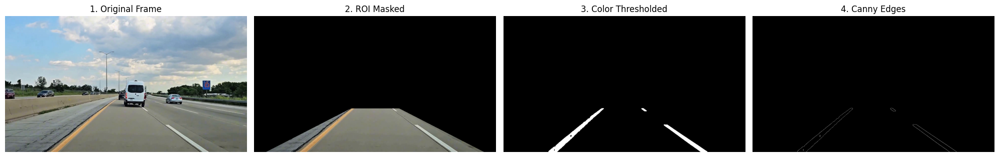

✓ Preprocessing complete - ready for line detection


In [9]:
# Load test frame
frames_dir = os.path.join('..', 'data', 'frames_sample')
frame_name = 'frame_t10_f600.png'
frame_path = os.path.join(frames_dir, frame_name)
frame = cv2.imread(frame_path)

if frame is None:
    raise FileNotFoundError(f"Frame not found: {frame_path}")

print(f"✓ Loaded frame: {frame_name}")
print(f"  Shape: {frame.shape}")

# Apply preprocessing pipeline
frame_roi, roi_pts = apply_roi_mask(frame)
color_mask = apply_color_threshold(frame_roi)
edges = apply_canny(color_mask)

# Visualize preprocessing stages
fig, axes = plt.subplots(1, 4, figsize=(20, 5))

axes[0].imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
axes[0].set_title('1. Original Frame')
axes[0].axis('off')

axes[1].imshow(cv2.cvtColor(frame_roi, cv2.COLOR_BGR2RGB))
axes[1].set_title('2. ROI Masked')
axes[1].axis('off')

axes[2].imshow(color_mask, cmap='gray')
axes[2].set_title('3. Color Thresholded')
axes[2].axis('off')

axes[3].imshow(edges, cmap='gray')
axes[3].set_title('4. Canny Edges')
axes[3].axis('off')

plt.tight_layout()
plt.show()

print("✓ Preprocessing complete - ready for line detection")

## 3. Hough Line Detection
Apply Probabilistic Hough Transform to detect line segments in the edge map.

✓ Detected 21 line segments


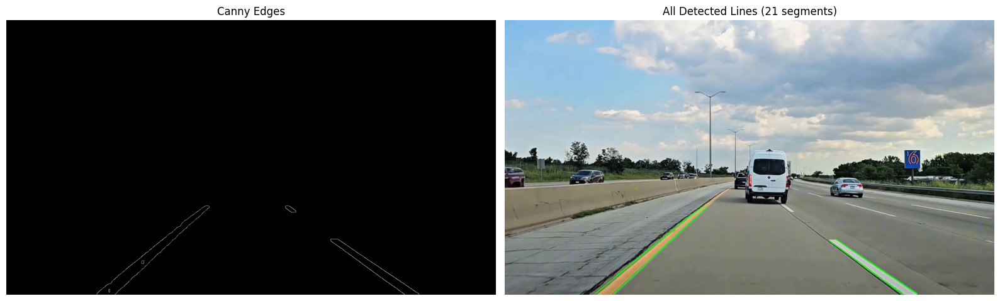

In [10]:
# Use pipeline function for Hough line detection
lines = detect_lines_hough(
    edges,
    threshold=15,
    min_line_length=40,
    max_line_gap=20
)

print(f"✓ Detected {len(lines) if lines is not None else 0} line segments")

# Visualize all detected lines using draw_lines
img_with_lines = frame.copy()
draw_lines(img_with_lines, lines, color=(0, 255, 0), thickness=2)

# Display result
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

axes[0].imshow(edges, cmap='gray')
axes[0].set_title('Canny Edges')
axes[0].axis('off')

axes[1].imshow(cv2.cvtColor(img_with_lines, cv2.COLOR_BGR2RGB))
axes[1].set_title(f'All Detected Lines ({len(lines) if lines is not None else 0} segments)')
axes[1].axis('off')

plt.tight_layout()
plt.show()

## 4. Filter Lines by Slope
Separate lines into left lane (negative slope) and right lane (positive slope) candidates.

✓ Left lane candidates: 15 lines
✓ Right lane candidates: 6 lines


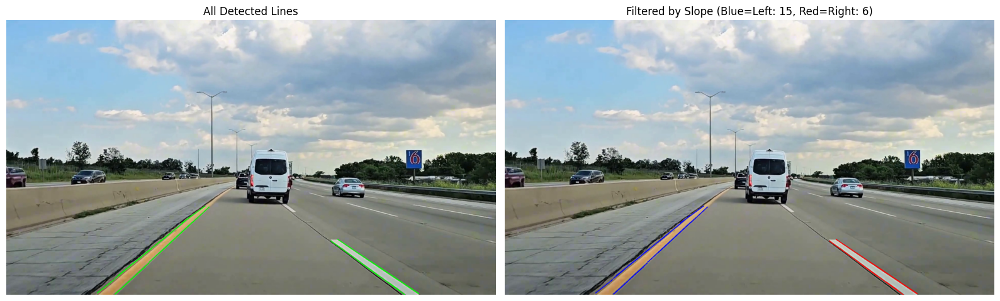

In [11]:
# Use pipeline function to filter lines by slope
left_lines, right_lines = filter_lines_by_slope(lines, min_slope=0.5, max_slope=2.0)

print(f"✓ Left lane candidates: {len(left_lines)} lines")
print(f"✓ Right lane candidates: {len(right_lines)} lines")

# Visualize filtered lines using draw_lines
img_filtered = frame.copy()
draw_lines(img_filtered, left_lines, color=(255, 0, 0), thickness=2)   # Blue for left
draw_lines(img_filtered, right_lines, color=(0, 0, 255), thickness=2)  # Red for right

# Display result
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

axes[0].imshow(cv2.cvtColor(img_with_lines, cv2.COLOR_BGR2RGB))
axes[0].set_title('All Detected Lines')
axes[0].axis('off')

axes[1].imshow(cv2.cvtColor(img_filtered, cv2.COLOR_BGR2RGB))
axes[1].set_title(f'Filtered by Slope (Blue=Left: {len(left_lines)}, Red=Right: {len(right_lines)})')
axes[1].axis('off')

plt.tight_layout()
plt.show()

## 5. Select Inner Lane Boundaries
Filter to keep only the **innermost** lines - the ones closest to the center but not too far away.
This identifies the current lane boundaries, not neighboring lanes.

✓ Selected inner left line: Yes
✓ Selected inner right line: Yes
✓ Fitted left lane line: Yes
✓ Fitted right lane line: Yes


C:\Users\nirdu\AppData\Local\Temp\ipykernel_17636\386048541.py:49: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()


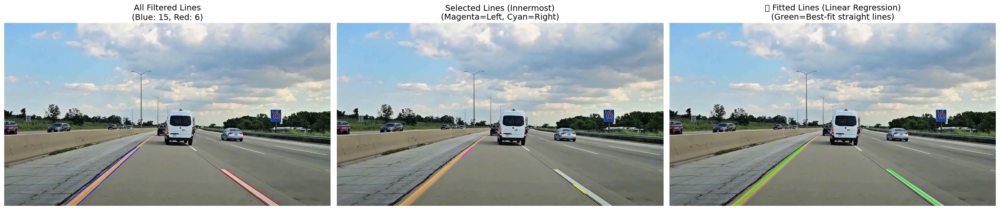


LINE PARAMETERS COMPARISON
Left lane  - Angle:  -41.2°, Bottom X:  381
Right lane - Angle:   35.7°, Bottom X: 1588


In [12]:
# Get frame dimensions
h, w = frame.shape[:2]

# Method 1: Select inner lane boundaries (single line from each side)
selected_left, selected_right = select_inner_lane_lines(left_lines, right_lines, w, h)
print(f"✓ Selected inner left line: {'Yes' if selected_left is not None else 'No'}")
print(f"✓ Selected inner right line: {'Yes' if selected_right is not None else 'No'}")

# Method 2: 🎯 Fit all lines to ONE straight line per side (LINEAR REGRESSION)
fitted_left = fit_lane_line(left_lines, h)
fitted_right = fit_lane_line(right_lines, h)
print(f"✓ Fitted left lane line: {'Yes' if fitted_left is not None else 'No'}")
print(f"✓ Fitted right lane line: {'Yes' if fitted_right is not None else 'No'}")

# Visualize comparison: 3 methods side by side
fig, axes = plt.subplots(1, 3, figsize=(24, 7))

# 1. All filtered lines (many small segments)
img_all = frame.copy()
draw_lines(img_all, left_lines, color=(255, 0, 0), thickness=2)
draw_lines(img_all, right_lines, color=(0, 0, 255), thickness=2)

axes[0].imshow(cv2.cvtColor(img_all, cv2.COLOR_BGR2RGB))
axes[0].set_title(f'All Filtered Lines\n(Blue: {len(left_lines)}, Red: {len(right_lines)})', fontsize=14)
axes[0].axis('off')

# 2. Selected inner lines (one line per side, chosen by position)
img_selected = frame.copy()
if selected_left is not None:
    draw_lines(img_selected, [selected_left], color=(255, 0, 255), thickness=4)
if selected_right is not None:
    draw_lines(img_selected, [selected_right], color=(0, 255, 255), thickness=4)

axes[1].imshow(cv2.cvtColor(img_selected, cv2.COLOR_BGR2RGB))
axes[1].set_title('Selected Lines (Innermost)\n(Magenta=Left, Cyan=Right)', fontsize=14)
axes[1].axis('off')

# 3. 🔥 Fitted lines (LINEAR REGRESSION - merges all lines into ONE straight line)
img_fitted = frame.copy()
if fitted_left is not None:
    draw_lines(img_fitted, fitted_left, color=(0, 255, 0), thickness=5)
if fitted_right is not None:
    draw_lines(img_fitted, fitted_right, color=(0, 255, 0), thickness=5)

axes[2].imshow(cv2.cvtColor(img_fitted, cv2.COLOR_BGR2RGB))
axes[2].set_title('🎯 Fitted Lines (Linear Regression)\n(Green=Best-fit straight lines)', fontsize=14)
axes[2].axis('off')

plt.tight_layout()
plt.show()

# Print line parameters for comparison
print("\n" + "="*60)
print("LINE PARAMETERS COMPARISON")
print("="*60)

if fitted_left is not None:
    x1, y1, x2, y2 = fitted_left
    slope_left = (y2 - y1) / (x2 - x1) if x2 != x1 else float('inf')
    angle_left = np.degrees(np.arctan(slope_left))
    print(f"Left lane  - Angle: {angle_left:6.1f}°, Bottom X: {x2:4d}")

if fitted_right is not None:
    x1, y1, x2, y2 = fitted_right
    slope_right = (y2 - y1) / (x2 - x1) if x2 != x1 else float('inf')
    angle_right = np.degrees(np.arctan(slope_right))
    print(f"Right lane - Angle: {angle_right:6.1f}°, Bottom X: {x2:4d}")

print("="*60)

## 6. Extrapolate Lines to Full ROI Height
Extend the detected line segments to span the full height of the ROI (from bottom to top).

ROI boundaries: bottom=1080, top=734
✓ Left line extrapolated: [381, np.int32(1080), 775, np.int32(734)]
✓ Right line extrapolated: [1588, np.int32(1080), 1107, np.int32(734)]


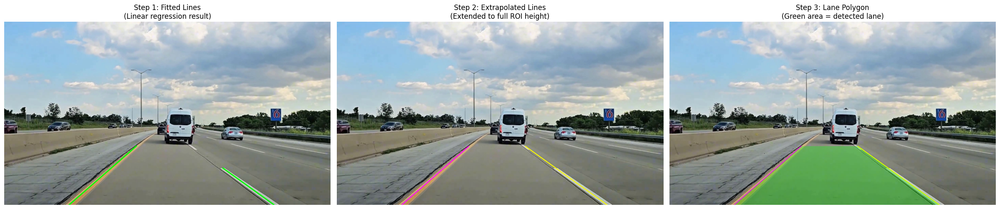


LINE EXTRAPOLATION COMPLETE


In [13]:
# Get ROI boundaries from roi_pts
# roi_pts shape: [[[x, y], [x, y], [x, y], [x, y]]]
# Bottom-left, Bottom-right, Top-right, Top-left
roi_bottom_y = roi_pts[0][0][1]  # y coordinate at bottom
roi_top_y = roi_pts[0][3][1]     # y coordinate at top

print(f"ROI boundaries: bottom={roi_bottom_y}, top={roi_top_y}")

# Extrapolate FITTED lines (not selected lines) using pipeline function
extrapolated_left = None
extrapolated_right = None

if fitted_left is not None:
    extrapolated_left = extrapolate_line(fitted_left, roi_bottom_y, roi_top_y)
    print(f"✓ Left line extrapolated: {extrapolated_left}")

if fitted_right is not None:
    extrapolated_right = extrapolate_line(fitted_right, roi_bottom_y, roi_top_y)
    print(f"✓ Right line extrapolated: {extrapolated_right}")

# Visualize extrapolated lines
img_extrapolated = frame.copy()

# Draw extrapolated lines using draw_lines
if extrapolated_left is not None:
    draw_lines(img_extrapolated, extrapolated_left, color=(255, 0, 255), thickness=4)  # Magenta

if extrapolated_right is not None:
    draw_lines(img_extrapolated, extrapolated_right, color=(0, 255, 255), thickness=4)  # Cyan

# Draw lane polygon if both lines exist
if extrapolated_left is not None and extrapolated_right is not None:
    # Create polygon points: bottom-left, top-left, top-right, bottom-right
    pts = np.array([
        [extrapolated_left[0], extrapolated_left[1]],    # Left bottom
        [extrapolated_left[2], extrapolated_left[3]],    # Left top
        [extrapolated_right[2], extrapolated_right[3]],  # Right top
        [extrapolated_right[0], extrapolated_right[1]]   # Right bottom
    ], dtype=np.int32)
    
    # Create overlay for semi-transparent fill
    overlay = img_extrapolated.copy()
    cv2.fillPoly(overlay, [pts], (0, 255, 0))  # Green fill
    cv2.addWeighted(overlay, 0.3, img_extrapolated, 0.7, 0, img_extrapolated)

# Display progression: Fitted → Extrapolated → With Polygon
fig, axes = plt.subplots(1, 3, figsize=(24, 6))

# Image 1: Fitted lines (short, from linear regression)
axes[0].imshow(cv2.cvtColor(img_fitted, cv2.COLOR_BGR2RGB))
axes[0].set_title('Step 1: Fitted Lines\n(Linear regression result)')
axes[0].axis('off')

# Image 2: Extrapolated lines (without polygon)
img_lines_only = frame.copy()
if extrapolated_left is not None:
    draw_lines(img_lines_only, extrapolated_left, color=(255, 0, 255), thickness=4)
if extrapolated_right is not None:
    draw_lines(img_lines_only, extrapolated_right, color=(0, 255, 255), thickness=4)

axes[1].imshow(cv2.cvtColor(img_lines_only, cv2.COLOR_BGR2RGB))
axes[1].set_title('Step 2: Extrapolated Lines\n(Extended to full ROI height)')
axes[1].axis('off')

# Image 3: With lane polygon
axes[2].imshow(cv2.cvtColor(img_extrapolated, cv2.COLOR_BGR2RGB))
axes[2].set_title('Step 3: Lane Polygon\n(Green area = detected lane)')
axes[2].axis('off')

plt.tight_layout()
plt.show()

print("\n" + "="*60)
print("LINE EXTRAPOLATION COMPLETE")
print("="*60)

## 7. Multi-Frame Testing with Lane Polygon
Test the complete pipeline (detection + extrapolation + polygon) on multiple frames across the video.

🎯 Processing frames with LINEAR REGRESSION (fit_lane_line)
Pipeline: detect_lines_hough → filter_lines_by_slope → fit_lane_line → extrapolate → draw
 1. frame_t1_f60.png          : L:✓ R:✓
 2. frame_t4_f240.png         : L:✓ R:✓
 3. frame_t8_f480.png         : L:✓ R:✓
 4. frame_t9_f540.png         : L:✓ R:✓
 5. frame_t10_f600.png        : L:✓ R:✓
 6. frame_t12_f720.png        : L:✓ R:✓
 7. frame_t27_f1620.png       : L:✓ R:✓
 8. frame_t28_f1680.png       : L:✓ R:✓
 9. frame_t29_f1740.png       : L:✓ R:✓
10. frame_t34_f2040.png       : L:✓ R:✓
11. frame_t105_f6300.png      : L:✓ R:✓
12. frame_t107_f6420.png      : L:✓ R:✓
13. frame_t109_f6540.png      : L:✓ R:✓
14. frame_t110_f6600.png      : L:✓ R:✓
15. frame_t143_f8580.png      : L:✓ R:✓
16. frame_t153_f9180.png      : L:✓ R:✓
17. frame_t185_f11100.png     : L:✓ R:✓
18. frame_t186_f11160.png     : L:✓ R:✓
19. frame_t187_f11220.png     : L:✓ R:✓
20. frame_t188_f11280.png     : L:✓ R:✓
21. frame_t200_f12000.png     : L:✓ R:✓
22. frame_t

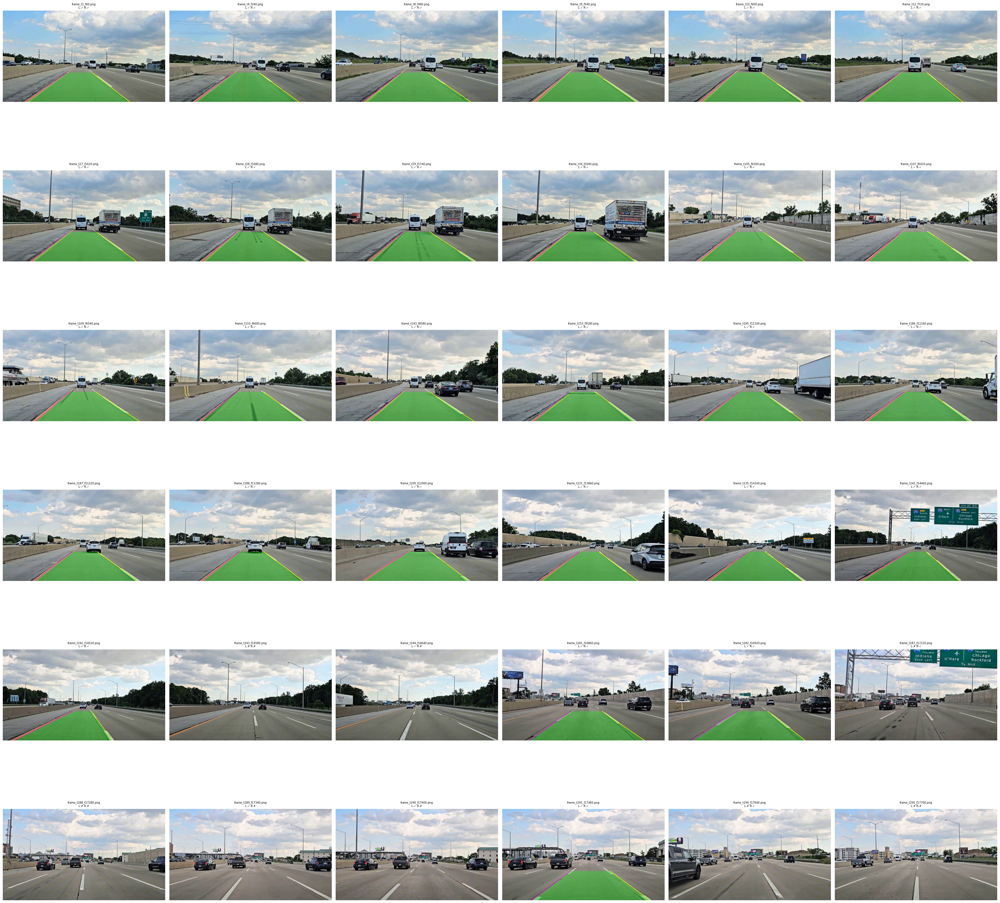


MULTI-FRAME TESTING COMPLETE (Using fit_lane_line)

Detection Summary:
  Both lanes (LINEAR REGRESSION): 28/36 (77.8%)
  One lane detected: 5/36 (13.9%)
  No lanes detected: 3/36 (8.3%)


In [14]:
# All 36 test frames available in the directory
test_frames = [
    'frame_t1_f60.png', 'frame_t4_f240.png', 'frame_t8_f480.png', 'frame_t9_f540.png',
    'frame_t10_f600.png', 'frame_t12_f720.png', 'frame_t27_f1620.png', 'frame_t28_f1680.png',
    'frame_t29_f1740.png', 'frame_t34_f2040.png', 'frame_t105_f6300.png', 'frame_t107_f6420.png',
    'frame_t109_f6540.png', 'frame_t110_f6600.png', 'frame_t143_f8580.png', 'frame_t153_f9180.png',
    'frame_t185_f11100.png', 'frame_t186_f11160.png', 'frame_t187_f11220.png', 'frame_t188_f11280.png',
    'frame_t200_f12000.png', 'frame_t231_f13860.png', 'frame_t235_f14100.png', 'frame_t241_f14460.png',
    'frame_t242_f14520.png', 'frame_t243_f14580.png', 'frame_t244_f14640.png', 'frame_t281_f16860.png',
    'frame_t282_f16920.png', 'frame_t287_f17220.png', 'frame_t288_f17280.png', 'frame_t289_f17340.png',
    'frame_t290_f17400.png', 'frame_t291_f17460.png', 'frame_t294_f17640.png', 'frame_t295_f17700.png',
]

def process_frame_with_polygon(frame_path):
    """Process frame using pipeline functions: detect, fit, extrapolate, draw polygon."""
    frame = cv2.imread(frame_path)
    if frame is None:
        return None, "File not found"
    
    # Preprocessing using pipeline functions
    frame_roi, roi_pts = apply_roi_mask(frame)
    color_mask = apply_color_threshold(frame_roi)
    edges = apply_canny(color_mask)
    
    # Line detection using pipeline functions
    lines = detect_lines_hough(edges, threshold=15, min_line_length=40, max_line_gap=20)
    if lines is None:
        return frame, "No lines"
    
    # Filter by slope using pipeline function
    left_lines, right_lines = filter_lines_by_slope(lines, min_slope=0.5)
    
    # 🎯 Fit lines using LINEAR REGRESSION (pipeline function)
    h, w = frame.shape[:2]
    fitted_left = fit_lane_line(left_lines, h)
    fitted_right = fit_lane_line(right_lines, h)
    
    status = f"L:{'✓' if fitted_left is not None else '✗'} R:{'✓' if fitted_right is not None else '✗'}"
    frame_with_polygon = frame.copy()
    
    # If both lines detected, extrapolate and draw polygon
    if fitted_left is not None and fitted_right is not None:
        roi_bottom_y = roi_pts[0][0][1]
        roi_top_y = roi_pts[0][3][1]
        
        # Extrapolate lines using pipeline function
        extrapolated_left = extrapolate_line(fitted_left, roi_bottom_y, roi_top_y)
        extrapolated_right = extrapolate_line(fitted_right, roi_bottom_y, roi_top_y)
        
        # Draw polygon
        pts = np.array([
            [extrapolated_left[0], extrapolated_left[1]],
            [extrapolated_left[2], extrapolated_left[3]],
            [extrapolated_right[2], extrapolated_right[3]],
            [extrapolated_right[0], extrapolated_right[1]]
        ], dtype=np.int32)
        
        overlay = frame_with_polygon.copy()
        cv2.fillPoly(overlay, [pts], (0, 255, 0))
        cv2.addWeighted(overlay, 0.3, frame_with_polygon, 0.7, 0, frame_with_polygon)
        
        # Draw extrapolated lines using pipeline function
        draw_lines(frame_with_polygon, extrapolated_left, color=(255, 0, 255), thickness=3)
        draw_lines(frame_with_polygon, extrapolated_right, color=(0, 255, 255), thickness=3)
    
    return frame_with_polygon, status

# Process all test frames
print("🎯 Processing frames with LINEAR REGRESSION (fit_lane_line)")
print("Pipeline: detect_lines_hough → filter_lines_by_slope → fit_lane_line → extrapolate → draw")
print("="*60)

results = []
for i, frame_name in enumerate(test_frames, 1):
    frame_path = os.path.join(frames_dir, frame_name)
    result_frame, status = process_frame_with_polygon(frame_path)
    results.append((frame_name, result_frame, status))
    print(f"{i:2d}. {frame_name:25s} : {status}")

# Visualize results in a 6x6 grid (36 frames)
rows, cols = 6, 6
fig, axes = plt.subplots(rows, cols, figsize=(36, 36))
axes = axes.flatten()

for idx, (frame_name, result_frame, status) in enumerate(results):
    if result_frame is None:
        axes[idx].text(0.5, 0.5, 'Not found', ha='center', va='center')
        axes[idx].set_title(frame_name, fontsize=9)
        axes[idx].axis('off')
        continue
    
    axes[idx].imshow(cv2.cvtColor(result_frame, cv2.COLOR_BGR2RGB))
    axes[idx].set_title(f'{frame_name}\n{status}', fontsize=7)
    axes[idx].axis('off')

plt.tight_layout()
plt.show()

# Summary statistics
print("\n" + "="*60)
print("MULTI-FRAME TESTING COMPLETE (Using fit_lane_line)")
print("="*60)

both_detected = sum(1 for _, _, status in results if status.count('✓') == 2)
partial_detected = sum(1 for _, _, status in results if status.count('✓') == 1)
none_detected = sum(1 for _, _, status in results if status.count('✗') == 2)

print(f"\nDetection Summary:")
print(f"  Both lanes (LINEAR REGRESSION): {both_detected}/{len(test_frames)} ({both_detected/len(test_frames)*100:.1f}%)")
print(f"  One lane detected: {partial_detected}/{len(test_frames)} ({partial_detected/len(test_frames)*100:.1f}%)")
print(f"  No lanes detected: {none_detected}/{len(test_frames)} ({none_detected/len(test_frames)*100:.1f}%)")
print("="*60)